### Evaluate results obtained with LoDNN

In [1]:
%matplotlib inline
import itertools
import matplotlib.pyplot as plt
from time import time
from tqdm import tqdm
import datetime
import os
import numpy as np
import tensorflow as tf
import keras
import sklearn.model_selection as sk
import copy
from PIL import Image as IM
from keras.callbacks import TensorBoard
import cv2
import json
import pathlib
from glob import glob
from sklearn.metrics import confusion_matrix, precision_recall_curve, average_precision_score

%load_ext autoreload
%autoreload 2

Using TensorFlow backend.


In [2]:
## import helpers
from helpers import data_loaders as dls
from helpers import pointcloud as pc
from helpers.viz import plot, plot_history, ConfusionMatrix
from helpers.logger import Logger
import utils
## import networks
from dl_models import get_lodnn_model
from evaluate_model import *

### 1 - Classic + Geometrical + Subsampling + HOG

  0%|          | 0/29 [00:00<?, ?it/s]

{'name': 'experiment0', 'test_name': 'Classical_Geometric_Subsampled_HOG_', 'run_id': 'lodnn_2019_07_24_15_29', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud


100%|██████████| 29/29 [00:00<00:00, 1407.40it/s]


Reading calibration files
Reading camera images
nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Read and Subsample cloud
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 7.934186935424805
Evaluating count
Count varies from 0 to 62
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 82.43741703033447
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 400, 200, 32)      4352      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 200, 100, 128)     36992     
_________________________________________________________________

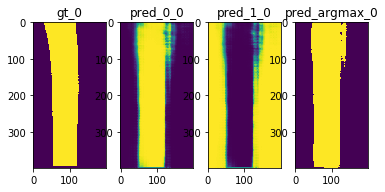

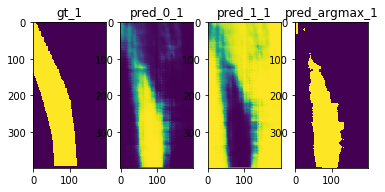

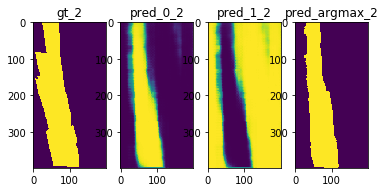

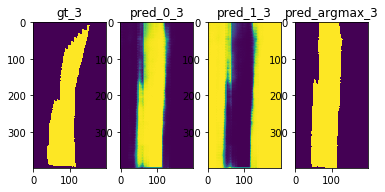

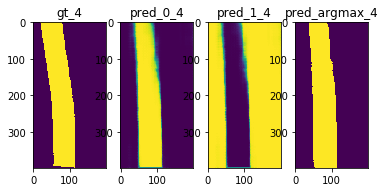

...

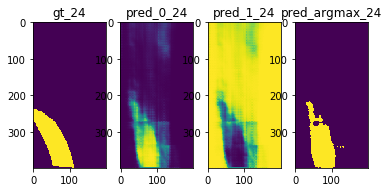

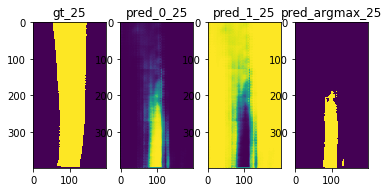

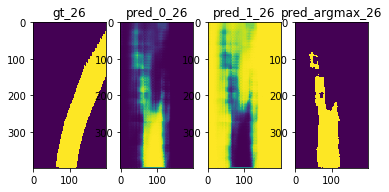

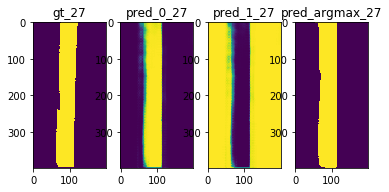

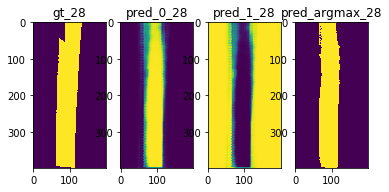

Normalized confusion matrix
[[0.91939313 0.08060687]
 [0.2272687  0.7727313 ]]
Overall Accuracy: 0.8680150862068966
IoU: 0.7456316018121698


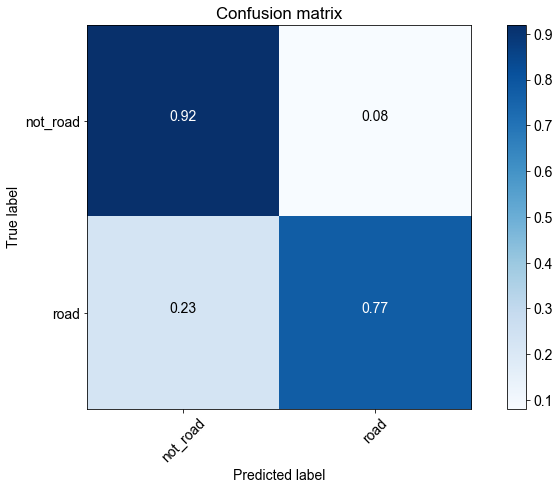

In [3]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_15_29/model/best_model.h5'

f_test_c_g_s_h, gt_test_c_g_s_h, model_c_g_s_h, scores_c_g_s_h, pred_c_g_s_h, times_c_g_s_h, conf_mat_c_g_s_h = evaluate_model(model_name, weights)

In [4]:
print("Scores:", scores_c_g_s_h)
print("Mean prediction time: ", times_c_g_s_h[1:].mean())

Scores: {'f1': 0.8039980668968895, 'recall': 0.7727312995395788, 'precision': 0.837901806620495, 'acc': 0.8680150862068966, 'jaccard': 0.6722380998255247}
Mean prediction time:  0.0917249151638576


In [25]:
plt.style.use('classic')

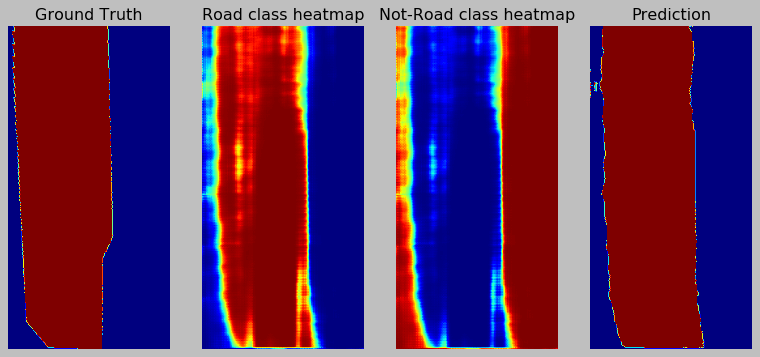

In [37]:
# n = np.random.randint(len(gt_test_c_g_s_h))
print(n)
n = 12
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_g_s_h[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_g_s_h[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_g_s_h[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_g_s_h[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_geom_sub_hog.eps', dpi=90)

plt.show()


### 2 - Classical + Geometric + Subsampled

100%|██████████| 29/29 [00:00<00:00, 2214.88it/s]

{'name': 'experiment0', 'test_name': 'Classical_Geometric_Subsampled_', 'run_id': 'lodnn_2019_07_24_15_45', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files
Reading camera images


nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Read and Subsample cloud
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 8.806193351745605
Evaluating count
Count varies from 0 to 62
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 27.969590187072754
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 400, 200, 32)      2624      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_8 (Spatial (None, 200, 100, 

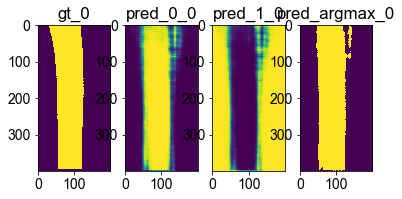

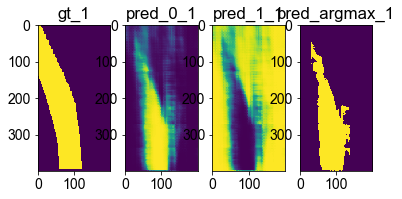

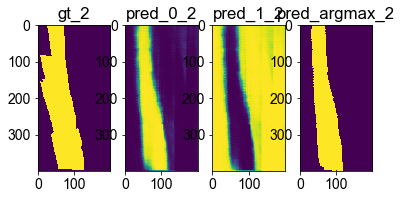

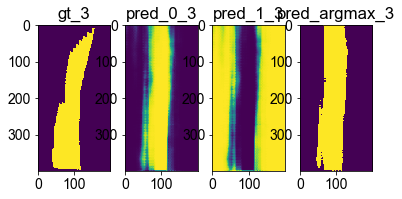

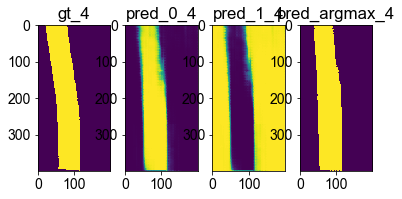

...

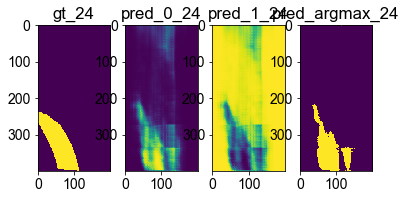

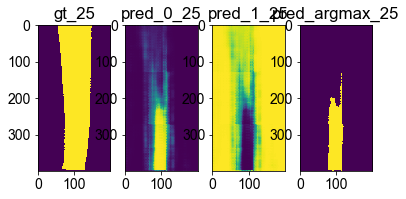

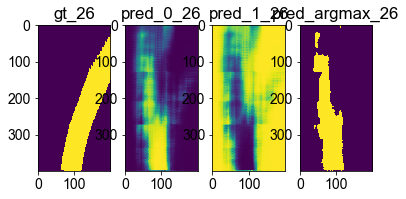

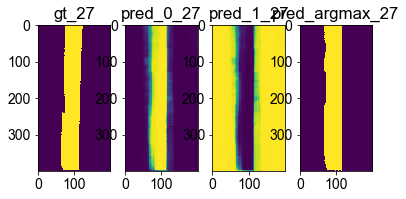

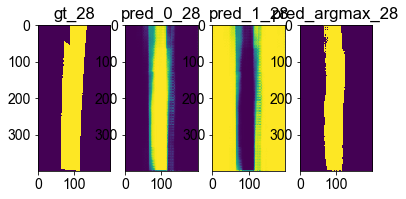

Normalized confusion matrix
[[0.9006539  0.0993461 ]
 [0.26587297 0.73412703]]
Overall Accuracy: 0.8423168103448276
IoU: 0.7038183478019018


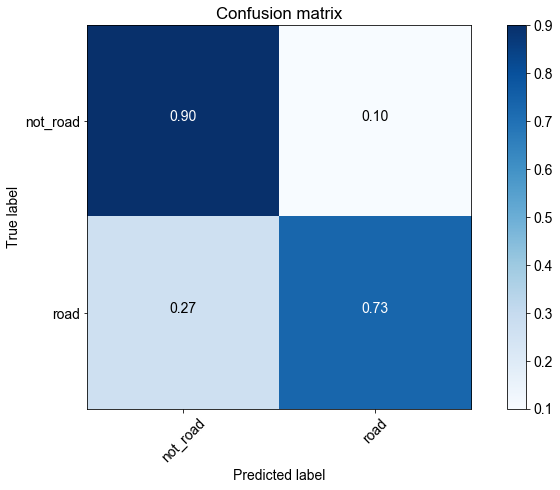

In [5]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_15_45/model/best_model.h5'
f_test_c_g_s, gt_test_c_g_s, model_c_g_s, scores_c_g_s, pred_c_g_s, times_c_g_s, conf_mat_c_g_s = evaluate_model(model_name, weights)

In [6]:
print(scores_c_g_s)
print("Mean prediction time: ", times_c_g_s.mean())

{'f1': 0.765365188807825, 'recall': 0.7341270329529711, 'precision': 0.7993799496510542, 'acc': 0.8423168103448276, 'jaccard': 0.6199122055118315}
Mean prediction time:  0.10155201780384984


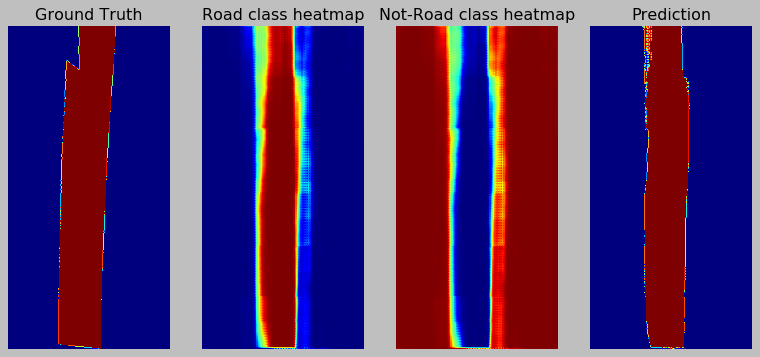

In [44]:
n = np.random.randint(len(gt_test_c_g_s_h))
# print(n)
n = 28
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_g_s[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_g_s[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_g_s[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_g_s[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_geom_sub.eps', dpi=90)

plt.show()

### 3 - Classical + Geometric + HOG

100%|██████████| 29/29 [00:00<00:00, 3515.97it/s]

{'name': 'experiment0', 'test_name': 'Classical_Geometric_HOG_', 'run_id': 'lodnn_2019_07_24_16_00', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files
Reading camera images


nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Evaluating count
Count varies from 0 to 122
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 195.44461464881897
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 400, 200, 32)      4352      
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_15 (Spatia (None, 200, 100, 128)     0         
_________________________________________________________________
c

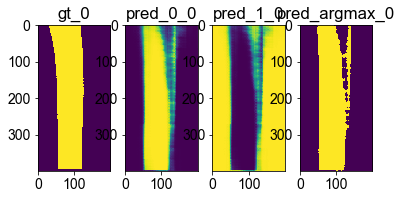

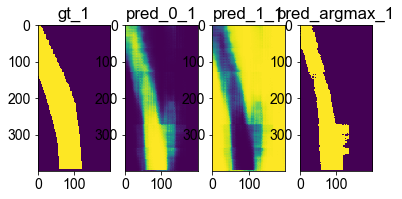

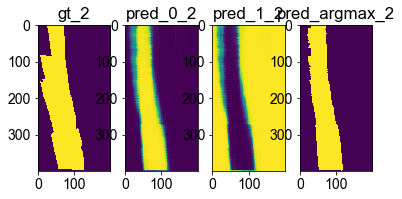

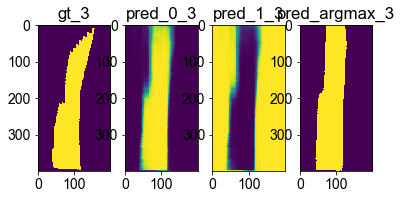

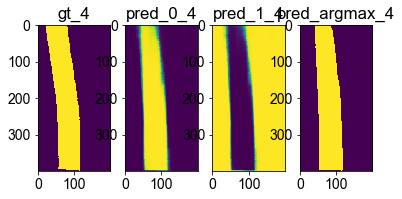

...

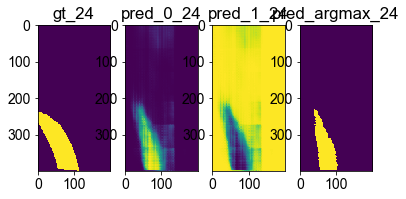

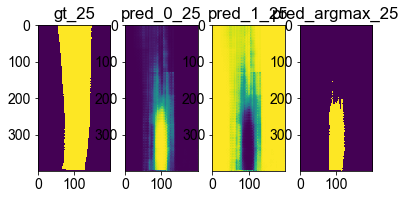

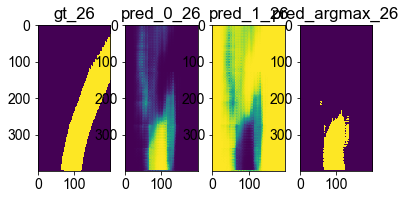

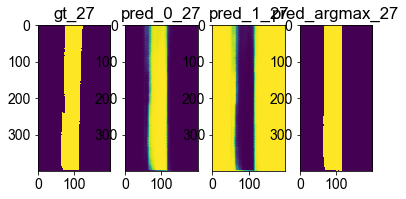

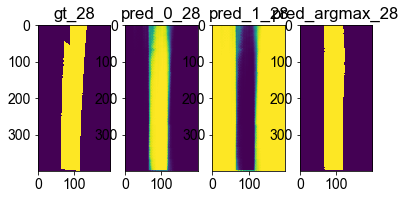

Normalized confusion matrix
[[0.91216149 0.08783851]
 [0.24048582 0.75951418]]
Overall Accuracy: 0.8586866379310345
IoU: 0.7302881149599387


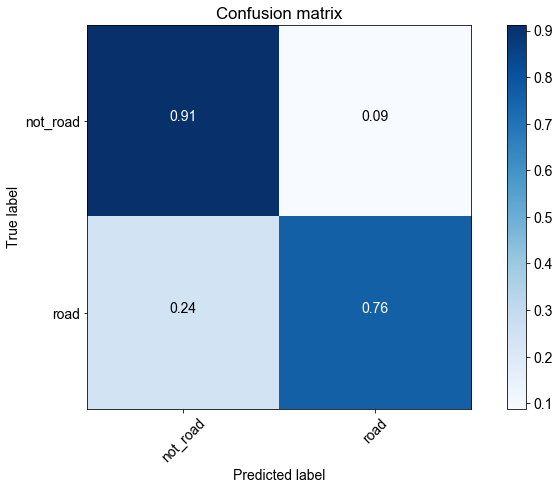

In [7]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_16_00/model/best_model.h5'
f_test_c_g_h, gt_test_c_g_h, model_c_g_h, scores_c_g_h, pred_c_g_h, times_c_g_h, conf_mat_c_g_h = evaluate_model(model_name, weights)

In [8]:
print(scores_c_g_h)
print("Mean prediction time: ", times_c_g_h.mean())

{'f1': 0.790166236456046, 'recall': 0.7595141829922213, 'precision': 0.8233964136650487, 'acc': 0.8586866379310345, 'jaccard': 0.6531196766582374}
Mean prediction time:  0.0991129628543196


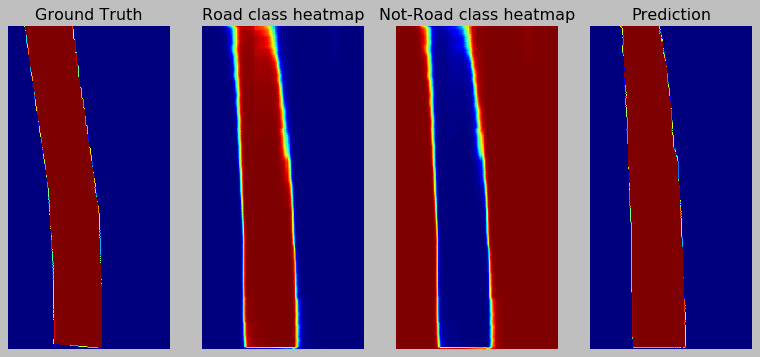

In [53]:
n = np.random.randint(len(gt_test_c_g_s_h))
# print(n)
n = 4
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_g_h[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_g_h[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_g_h[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_g_h[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_geom_hog.eps', dpi=90)

plt.show()

### 4 - Classical + Geometric

100%|██████████| 29/29 [00:00<00:00, 1835.14it/s]

{'name': 'experiment0', 'test_name': 'Classical_Geometric_', 'run_id': 'lodnn_2019_07_24_16_18', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files
Reading camera images


nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Evaluating count
Count varies from 0 to 122
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 47.73829460144043
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_37 (Conv2D)           (None, 400, 200, 32)      2624      
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_22 (Spatia (None, 200, 100, 128)     0         
_________________________________________________________________
co

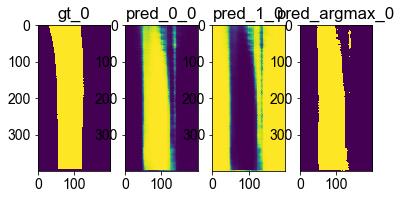

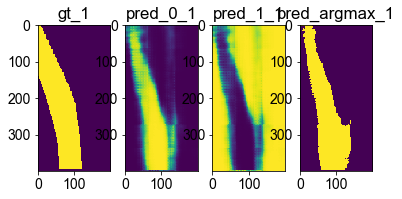

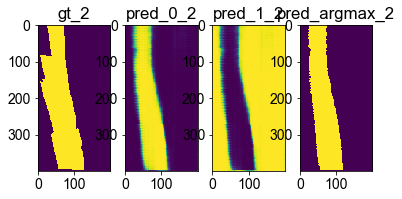

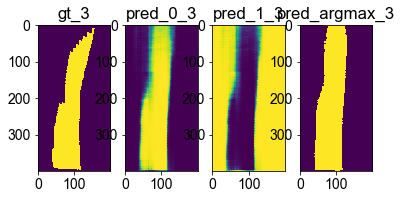

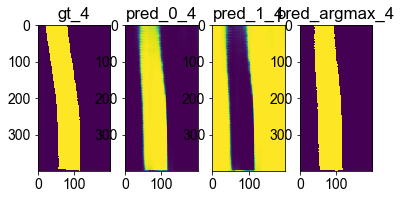

...

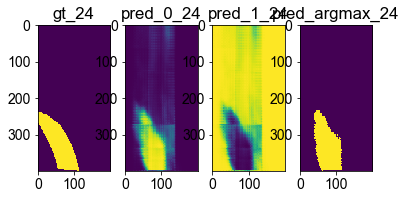

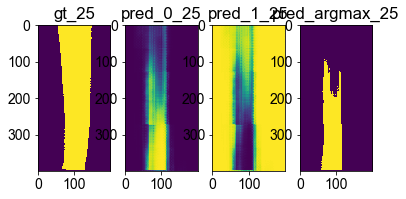

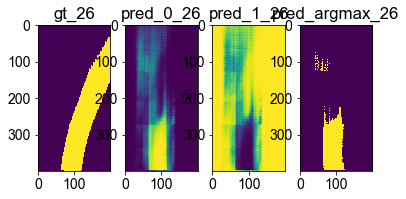

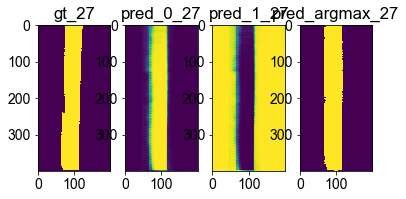

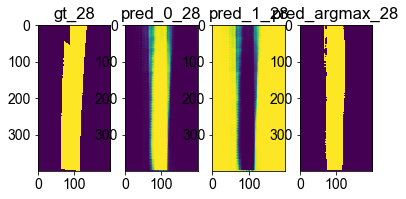

Normalized confusion matrix
[[0.9052377  0.0947623 ]
 [0.25379398 0.74620602]]
Overall Accuracy: 0.8495262931034483
IoU: 0.7154686461789048


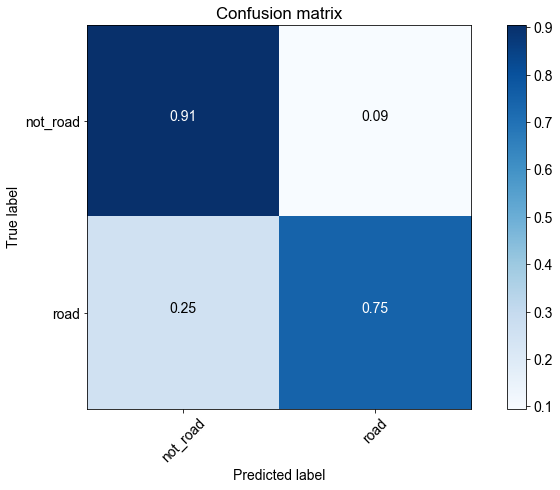

In [9]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_16_18/model/best_model.h5'
f_test_c_g, gt_test_c_g, model_c_g, scores_c_g, pred_c_g, times_c_g, conf_mat_c_g = evaluate_model(model_name, weights)

In [10]:
print(scores_c_g)
print("Mean prediction time: ", times_c_g.mean())

{'f1': 0.7765098432619542, 'recall': 0.7462060157443887, 'precision': 0.8093791663941897, 'acc': 0.8495262931034483, 'jaccard': 0.6346678303748773}
Mean prediction time:  0.09785469647111564


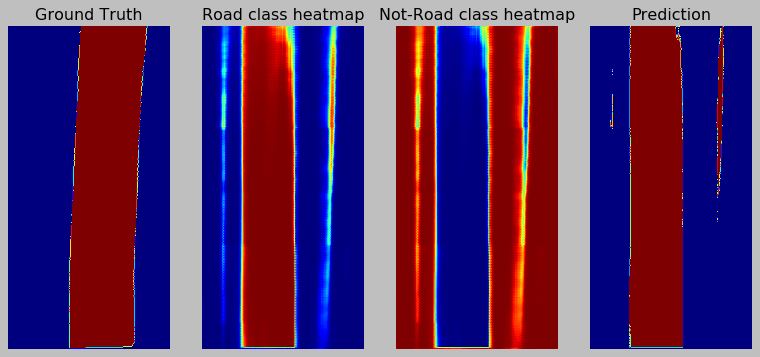

In [55]:
n = np.random.randint(len(gt_test_c_g))
# print(n)
n = 14
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_g[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_g[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_g[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_g[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_geom.eps', dpi=90)

plt.show()

### 5 - Classical + Subsampled + HOG

100%|██████████| 29/29 [00:00<00:00, 1871.77it/s]

{'name': 'experiment0', 'test_name': 'Classical_Subsampled_HOG_', 'run_id': 'lodnn_2019_07_24_16_33', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files


Reading camera images
nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Read and Subsample cloud
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 18.050659656524658
Evaluating count
Count varies from 0 to 62
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 81.87520241737366
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_49 (Conv2D)           (None, 400, 200, 32)      3488      
_________________________________________________________________
conv2d_50 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_29 (Sp

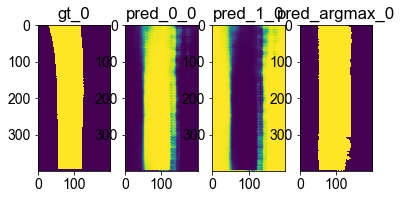

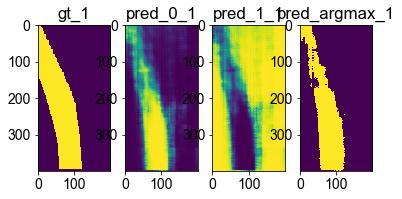

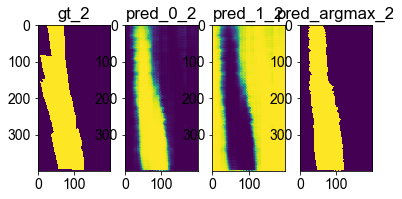

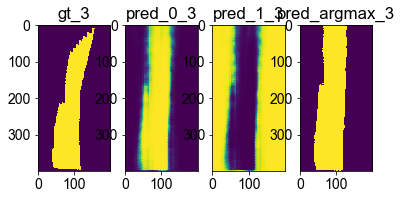

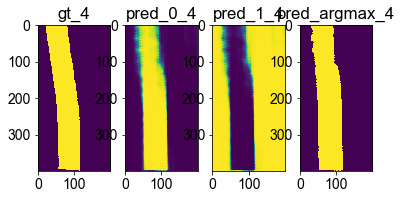

...

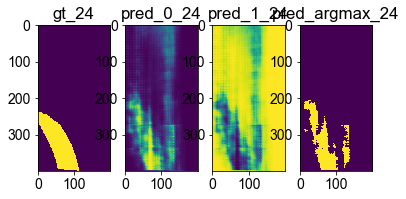

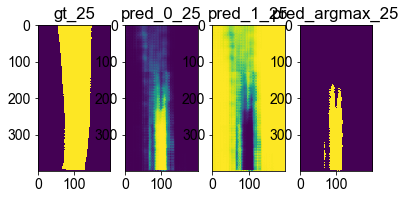

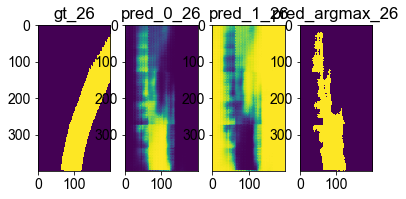

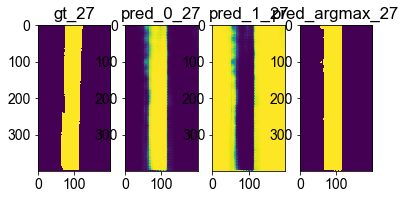

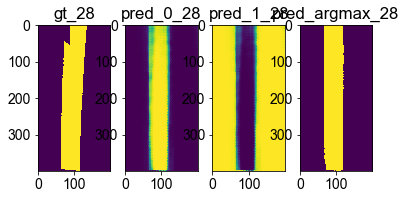

Normalized confusion matrix
[[0.91113247 0.08886753]
 [0.17658053 0.82341947]]
Overall Accuracy: 0.8804051724137931
IoU: 0.7694173329136604


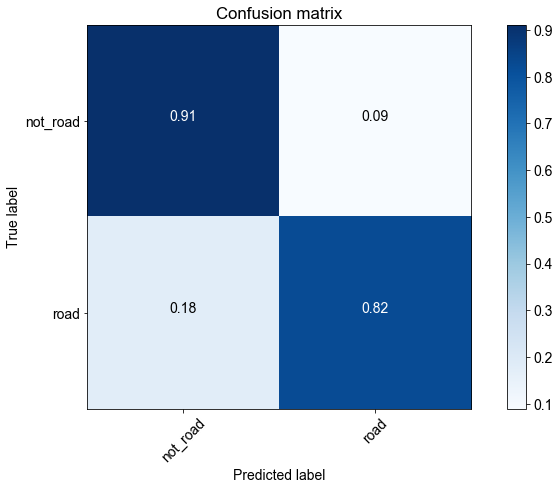

In [11]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_16_33/model/best_model.h5'
f_test_c_s_h, gt_test_c_s_h, model_c_s_h, scores_c_s_h, pred_c_s_h, times_c_s_h, conf_mat_c_s_h = evaluate_model(model_name, weights)

In [12]:
print(scores_c_s_h)
print("Mean prediction time: ", times_c_s_h.mean())

{'f1': 0.8282940425842656, 'recall': 0.8234194705770892, 'precision': 0.8332266723773856, 'acc': 0.8804051724137931, 'jaccard': 0.7069128882907759}
Mean prediction time:  0.1035897813994309


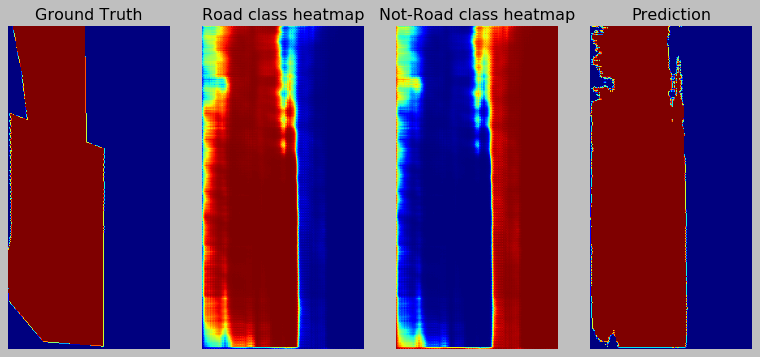

In [60]:
# n = np.random.randint(len(gt_test_c_s_h))
# print(n)
n = 10
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_s_h[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_s_h[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_s_h[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_s_h[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_sub_hog.eps', dpi=90)

plt.show()

### 6 - Classical + Subsampled

100%|██████████| 29/29 [00:00<00:00, 1722.21it/s]

{'name': 'experiment0', 'test_name': 'Classical_Subsampled_', 'run_id': 'lodnn_2019_07_24_16_50', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files
Reading camera images


nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Read and Subsample cloud
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 10.31412959098816
Evaluating count
Count varies from 0 to 62
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 5.007150411605835
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_61 (Conv2D)           (None, 400, 200, 32)      1760      
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_36 (Spatia (None, 200, 100, 1

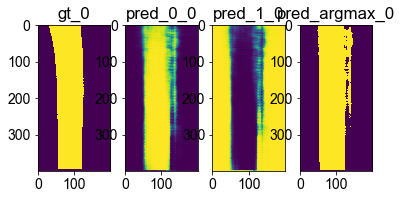

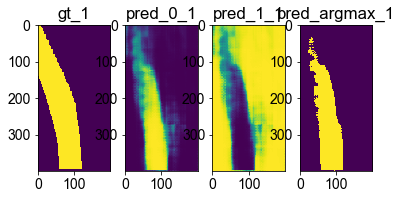

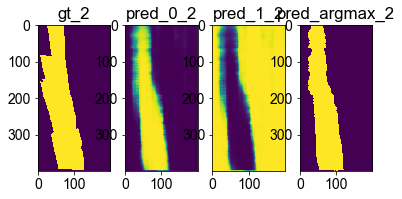

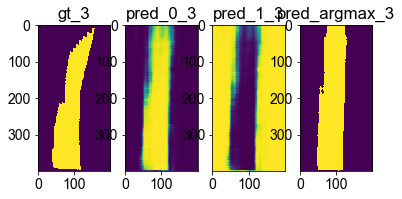

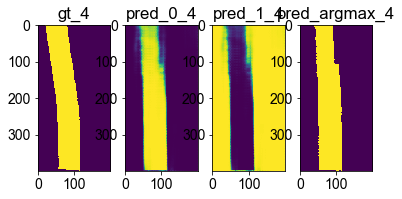

...

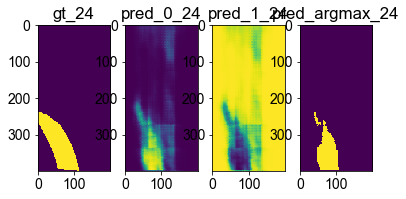

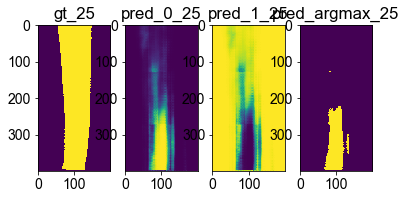

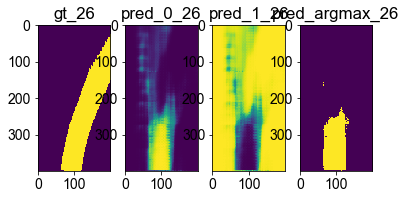

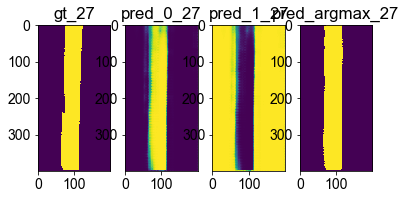

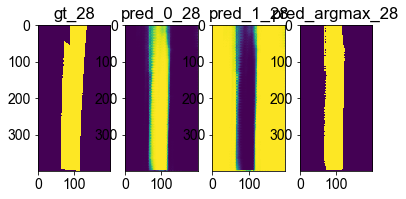

Normalized confusion matrix
[[0.93574857 0.06425143]
 [0.21343145 0.78656855]]
Overall Accuracy: 0.8834883620689655
IoU: 0.7709971459742687


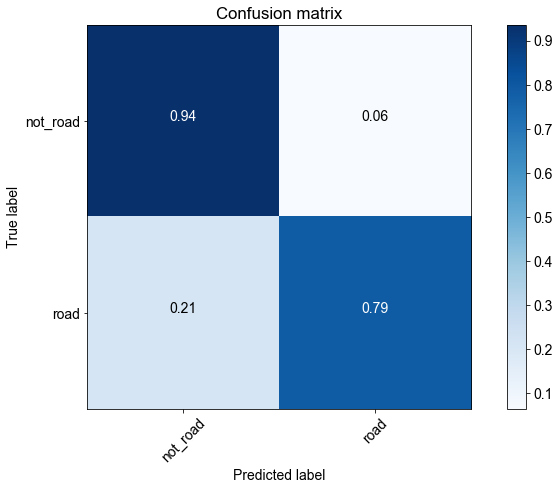

In [13]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_16_50/model/best_model.h5'
f_test_c_s, gt_test_c_s, model_c_s, scores_c_s, pred_c_s, times_c_s, conf_mat_c_s = evaluate_model(model_name, weights)

In [14]:
print(scores_c_s)
print("Mean prediction time: ", times_c_s.mean())

{'f1': 0.8254787910248191, 'recall': 0.7865685451820645, 'precision': 0.8684390346617037, 'acc': 0.8834883620689655, 'jaccard': 0.702821528225177}
Mean prediction time:  0.10081954660086796


17


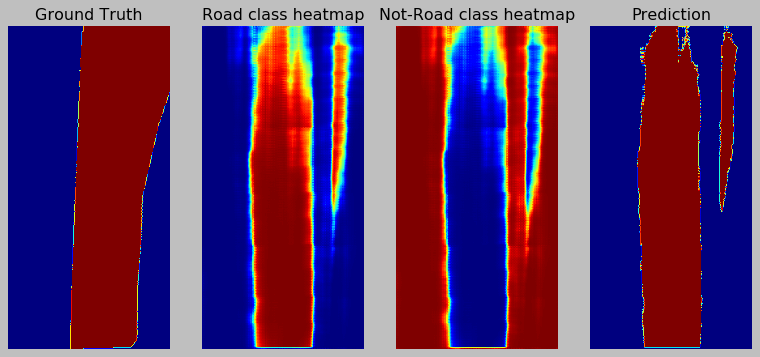

In [63]:
# n = np.random.randint(len(gt_test_c_s))
print(n)
n = 17
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_s[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_s[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_s[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_s[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_sub.eps', dpi=90)

plt.show()

### 7 - Classical + HOG

100%|██████████| 29/29 [00:00<00:00, 1892.80it/s]

{'name': 'experiment0', 'test_name': 'Classical_HOG_', 'run_id': 'lodnn_2019_07_24_17_04', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files
Reading camera images


nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Evaluating count
Count varies from 0 to 122
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 138.66549253463745
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_73 (Conv2D)           (None, 400, 200, 32)      3488      
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_75 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_43 (Spatia (None, 200, 100, 128)     0         
_________________________________________________________________
c

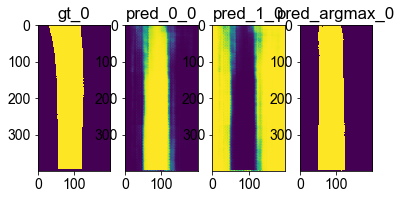

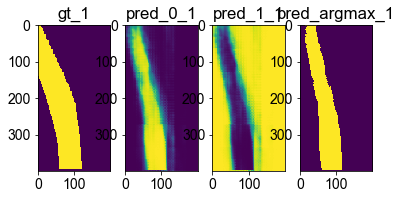

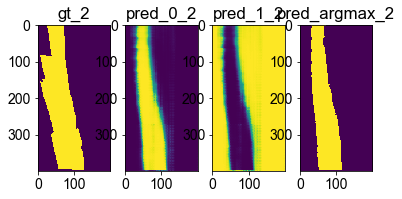

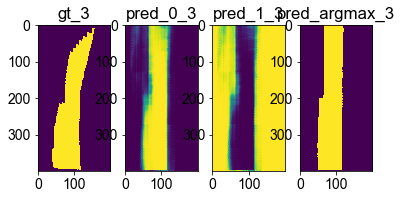

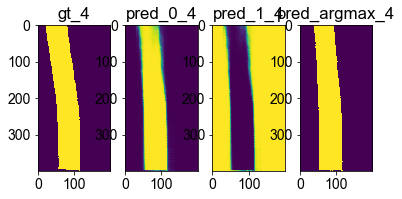

...

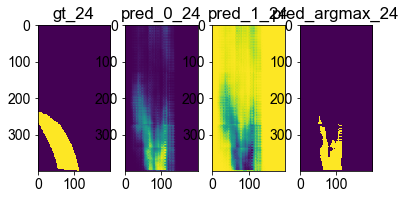

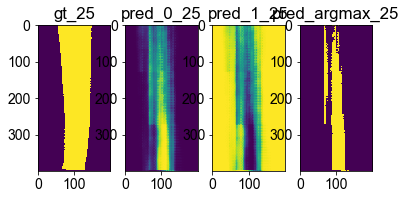

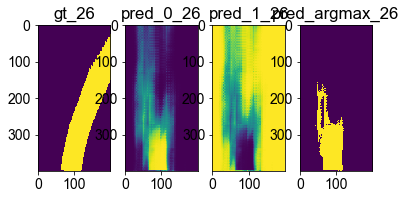

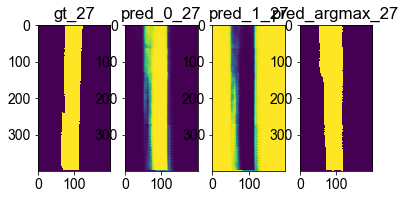

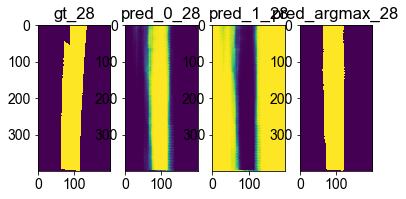

Normalized confusion matrix
[[0.92123222 0.07876778]
 [0.28380872 0.71619128]]
Overall Accuracy: 0.8494030172413793
IoU: 0.7119348847650679


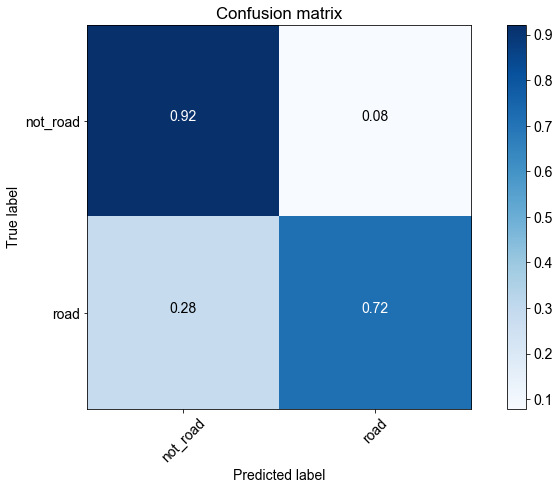

In [15]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_17_04/model/best_model.h5'
f_test_c_h, gt_test_c_h, model_c_h, scores_c_h, pred_c_h, times_c_h, conf_mat_c_h = evaluate_model(model_name, weights)

In [16]:
print(scores_c_h)
print("Mean prediction time: ", times_c_h.mean())

{'f1': 0.7691590063236233, 'recall': 0.7161912753742307, 'precision': 0.8305871743172416, 'acc': 0.8494030172413793, 'jaccard': 0.6249052560609282}
Mean prediction time:  0.10227290515241952


21


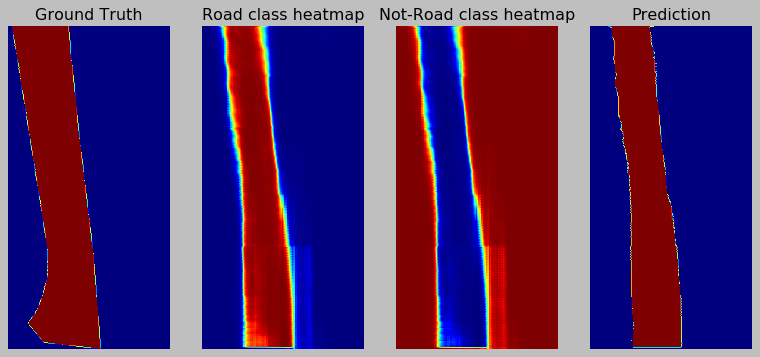

In [66]:
# n = np.random.randint(len(gt_test_c_h))
print(n)
n = 21
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c_h[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c_h[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c_h[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c_h[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic_hog.eps', dpi=90)

plt.show()

### 8 - Classical

100%|██████████| 29/29 [00:00<00:00, 1916.26it/s]

{'name': 'experiment0', 'test_name': 'Classical_', 'run_id': 'lodnn_2019_07_24_17_21', 'dataset': 'KITTI', 'training_config': {'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}}
{'loss_function': 'binary_crossentropy', 'learning_rate': 0.0001, 'batch_size': 3, 'epochs': 100, 'optimizer': 'keras.optimizers.Adam'}
dict_keys(['imgs', 'calib', 'gt', 'gt_bev', 'lodnn_gt', 'pc'])
Reading cloud
Reading calibration files
Reading camera images


nCPUs = 8
(257, 2)
Height ranges from -30.21500015258789 to 2.9130001068115234
Evaluating count
Count varies from 0 to 122
Extracting features
nCPUs = 8
nCPUs = 8
nCPUs = 8
Evaluated in : 11.874018430709839
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_85 (Conv2D)           (None, 400, 200, 32)      1760      
_________________________________________________________________
conv2d_86 (Conv2D)           (None, 400, 200, 32)      9248      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 200, 100, 32)      0         
_________________________________________________________________
conv2d_87 (Conv2D)           (None, 200, 100, 128)     36992     
_________________________________________________________________
spatial_dropout2d_50 (Spatia (None, 200, 100, 128)     0         
_________________________________________________________________
c

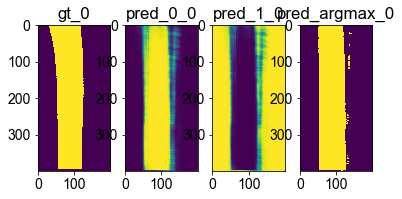

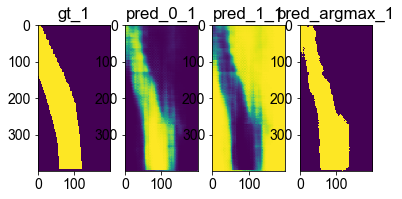

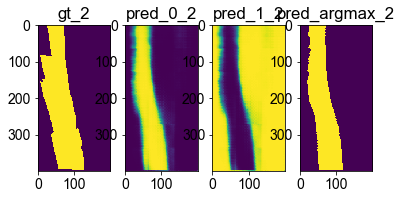

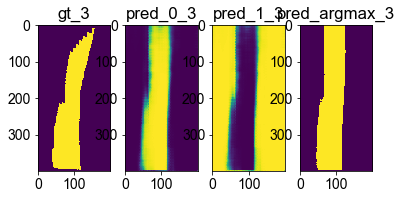

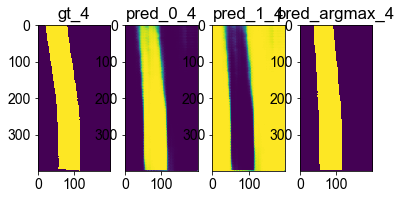

...

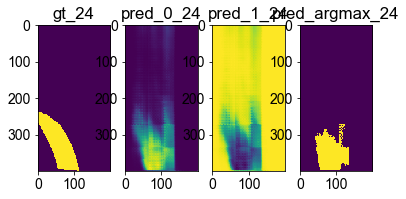

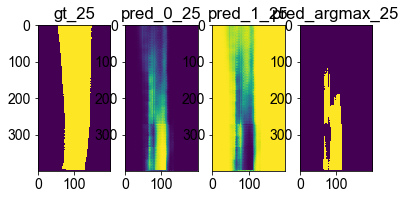

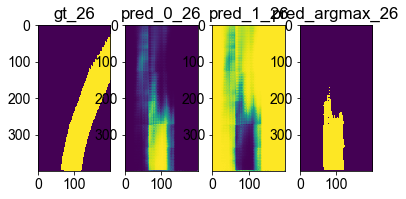

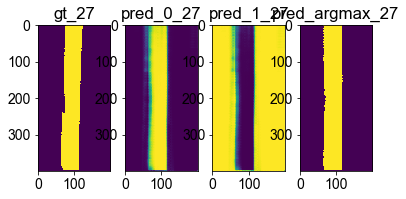

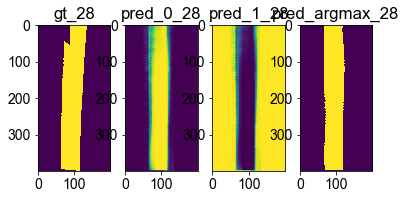

Normalized confusion matrix
[[0.92932037 0.07067963]
 [0.21680648 0.78319352]]
Overall Accuracy: 0.8781297413793103
IoU: 0.762240009805115


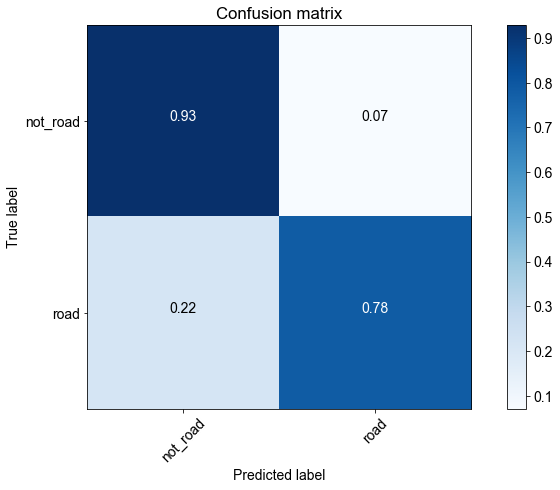

In [17]:
model_name = 'lodnn'
weights = 'output/experiment0/lodnn_2019_07_24_17_21//model/best_model.h5'
f_test_c, gt_test_c, model_c, scores_c, pred_c, times_c, conf_mat_c = evaluate_model(model_name, weights)

In [18]:
print(scores_c)

{'f1': 0.8182671881578228, 'recall': 0.7831935171901262, 'precision': 0.8566295364714337, 'acc': 0.8781297413793103, 'jaccard': 0.692429946903348}


In [19]:
print(times_c.mean())

0.10459807823444235


2


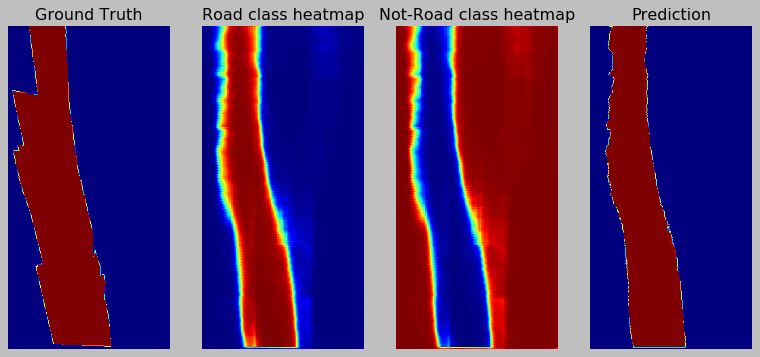

In [71]:
# n = np.random.randint(len(gt_test_c))
print(n)
n = 2
f, ax = plt.subplots(1, 4, figsize=(12,12))
ax[0].imshow(gt_test_c[n, :, :, 0])
ax[0].set_title('Ground Truth')
ax[0].axis('off')
ax[1].imshow(pred_c[n, :, :, 0])
ax[1].set_title('Road class heatmap'.format(n))
ax[1].axis('off')
ax[2].imshow(pred_c[n, :, :, 1])
ax[2].set_title('Not-Road class heatmap'.format(n))
ax[2].axis('off')

ax[3].imshow(1 - np.argmax(pred_c[n, :, :, :], axis=2))
ax[3].set_title('Prediction'.format(n))
ax[3].axis('off')
# plt.tight_layout()
plt.savefig('pred_classic.eps', dpi=90)

plt.show()

### ROC Curves of all the tests

In [20]:
plt.style.use('ggplot')
plt.rcParams.update({'font.size': 18})

In [21]:
gt_c       = gt_test_c[:,:,:,0].flatten()
p_c        = pred_c[:,:,:,0].flatten()
prec_c, rec_c, _ = precision_recall_curve(gt_c, p_c)

gt_c_g     = gt_test_c_g[:,:,:,0].flatten()
p_c_g      = pred_c_g[:,:,:,0].flatten()
prec_c_g, rec_c_g, _ = precision_recall_curve(gt_c_g, p_c_g)

gt_c_h     = gt_test_c_h[:,:,:,0].flatten()
p_c_h      = pred_c_h[:,:,:,0].flatten()
prec_c_h, rec_c_h, _ = precision_recall_curve(gt_c_h, p_c_h)

gt_c_g_h   = gt_test_c_g_h[:,:,:,0].flatten()
p_c_g_h    = pred_c_g_h[:,:,:,0].flatten()
prec_c_g_h, rec_c_g_h, _ = precision_recall_curve(gt_c_g_h, p_c_g_h)

gt_c_s     = gt_test_c_s[:,:,:,0].flatten()
p_c_s      = pred_c_s[:,:,:,0].flatten()
prec_c_s, rec_c_s, _ = precision_recall_curve(gt_c_s, p_c_s)

gt_c_s_h   = gt_test_c_s_h[:,:,:,0].flatten()
p_c_s_h    = pred_c_s_h[:,:,:,0].flatten()
prec_c_s_h, rec_c_s_h, _ = precision_recall_curve(gt_c_s_h, p_c_s_h)


gt_c_g_s   = gt_test_c_g_s[:,:,:,0].flatten()
p_c_g_s    = pred_c_g_s[:,:,:,0].flatten()
prec_c_g_s, rec_c_g_s, _ = precision_recall_curve(gt_c_g_s, p_c_g_s)


gt_c_g_s_h = gt_test_c_g_s_h[:,:,:,0].flatten()
p_c_g_s_h  = pred_c_g_s_h[:,:,:,0].flatten()
prec_c_g_s_h, rec_c_g_s_h, _ = precision_recall_curve(gt_c_g_s_h, p_c_g_s_h)

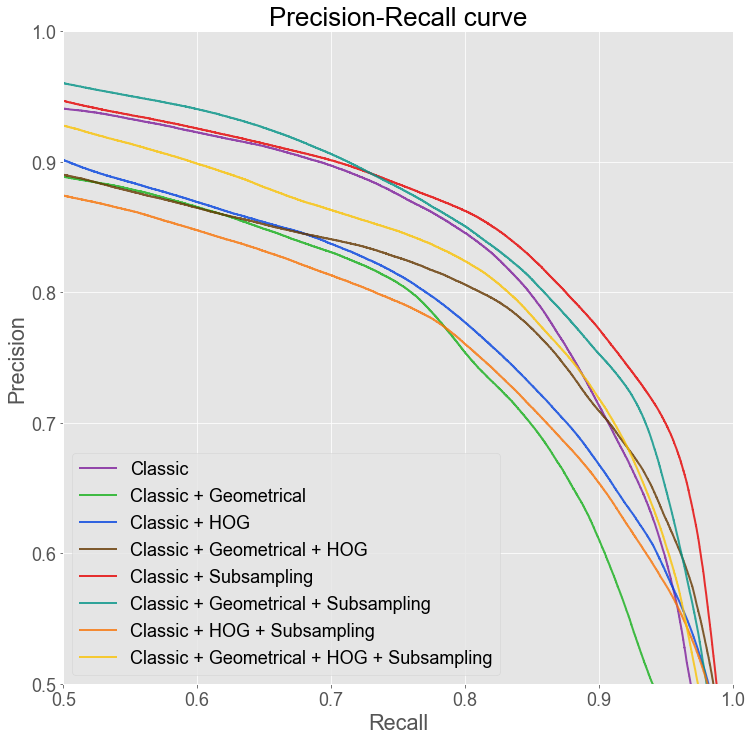

In [22]:
# In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
plt.figure(figsize=(12,12))
plt.step(rec_c, prec_c, linewidth=2, color='xkcd:purple', alpha=0.8, where='post')
plt.step(rec_c_g, prec_c_g, linewidth=2, color='xkcd:green', alpha=0.8, where='post')
plt.step(rec_c_h, prec_c_h, linewidth=2, color='xkcd:blue', alpha=0.8, where='post')
plt.step(rec_c_g_h, prec_c_g_h, linewidth=2, color='xkcd:brown', alpha=0.8, where='post')

plt.step(rec_c_s, prec_c_s, linewidth=2, color='xkcd:red', alpha=0.8, where='post')
plt.step(rec_c_s_h, prec_c_s_h, linewidth=2, color='xkcd:teal', alpha=0.8, where='post')
plt.step(rec_c_g_s, prec_c_g_s, linewidth=2, color='xkcd:orange', alpha=0.8, where='post')
plt.step(rec_c_g_s_h, prec_c_g_s_h, linewidth=2, color='xkcd:goldenrod', alpha=0.8, where='post')


# plt.step(recall1, precision1, color='r', alpha=0.2, where='post')


# plt.step(recall2, precision2, color='y', alpha=0.2, where='post')


# plt.step(recall3, precision3, color='b', alpha=0.2, where='post')


plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.5, 1.0])
plt.xlim([0.5, 1.0])
plt.title('Precision-Recall curve')
plt.legend(['Classic',
            'Classic + Geometrical',
            'Classic + HOG',
            'Classic + Geometrical + HOG',
            'Classic + Subsampling',
            'Classic + Geometrical + Subsampling',
            'Classic + HOG + Subsampling',
            'Classic + Geometrical + HOG + Subsampling'], loc=3)
# # plt.savefig('ROC.eps', dpi=90)